# Make and Save FisherMatrix objects

In [1]:
import crosspower as cp
import FisherCl as fcl # branch quickCl
#import camb

# set plotting to be in the notebook instead of its own qt window
%matplotlib inline

IMPORT ERROR: /opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/quicklens/mpi.pyc (No module named pypar). Could not load pbs or pypar. MPI will not be used.


In [2]:
# set cosmological parameters
# copied from FisherCl

cosParams = {
        'H0'    : None, #67.51, #setting H0=None allows cosmomc_theta to be used instead
        'cosmomc_theta'           : 1.04087e-2,
        'ombh2' : 0.02226,
        'omch2' : 0.1193,
        'omk'   : 0,
        'tau'   : 0.063,

        'As'    : 2.130e-9,
        'ns'    : 0.9653,
        'r'     : 0,
        'kPivot': 0.05,

        #'w'     : -1.0, # DARK ENERGY!!!
        'w'     : -0.95, # DARK ENERGY!!!
        'wa'    : 0.0,

        'mnu'   : 0.06, # (eV)
        'nnu'   : 3.046,
        'standard_neutrino_neff'  : 3.046,
        'num_massive_neutrinos'   : 1, #this param should be ignored except in degenerate hierarchy
        'neutrino_hierarchy'      : 'degenerate'}
        #'neutrino_hierarchy'      : 'normal'}
"""

# modified to match CMB-S4 science book fiducial values
# also need to modify parameter list in FisherMatrix to include H0
cosParams = {
        'H0'    : 69, #setting H0=None allows cosmomc_theta to be used instead
        'cosmomc_theta'           : None,
        'ombh2' : 0.0222,
        'omch2' : 0.120,
        'omk'   : 0,
        'tau'   : 0.06,

        'As'    : 2.20e-9,
        'ns'    : 0.966,
        'r'     : 0,
        'kPivot': 0.05,

        'w'     : -1.0, # DARK ENERGY!!!
        'wa'    : 0.0,

        'mnu'   : 0.06, # (eV)
        'nnu'   : 3.046,
        'standard_neutrino_neff'  : 3.046,
        'num_massive_neutrinos'   : 1, #this param should be ignored except in degenerate hierarchy
        'neutrino_hierarchy'      : 'normal'}

   
# modified to match Santos et. al. fiducial values, etc.
# also need to modify parameter list in FisherMatrix to include H0
# Note: They did not specify As,tau, so I am just using Planck values for these
cosParams = {
        'H0'    : 65, #setting H0=None allows cosmomc_theta to be used instead
        'cosmomc_theta'           : None,
        'ombh2' : 0.02219,
        'omch2' : 0.1122,
        'omk'   : 0,
        'tau'   : 0.063,

        'As'    : 2.130e-9,
        'ns'    : 0.952,
        'r'     : 0,
        'kPivot': 0.05,

        'w'     : -0.95, # DARK ENERGY!!!
        'wa'    : 0.0,

        'mnu'   : 0.250, # (eV)
        'nnu'   : 3.046,
        'standard_neutrino_neff'  : 3.046,
        'num_massive_neutrinos'   : 2, #this param should be ignored except in degenerate hierarchy
        'neutrino_hierarchy'      : 'degenerate'}



# modified to match Wu et al 2014 fiducial values
# also need to modify parameter list in FisherMatrix to include H0, omk
cosParams = {
        'H0'    : 67.11, #setting H0=None allows cosmomc_theta to be used instead
        'cosmomc_theta'           : None,
        'ombh2' : 0.022068,
        'omch2' : 0.12029,
        'omk'   : 0,
        'tau'   : 0.0925,

        'As'    : 2.215e-9,
        'ns'    : 0.9624,
        'r'     : 0,
        'kPivot': 0.05,

        'w'     : -1.0, # DARK ENERGY!!!
        'wa'    : 0.0,

        'mnu'   : 0.085, # (eV)
        'nnu'   : 3.046,
        'standard_neutrino_neff'  : 3.046,
        'num_massive_neutrinos'   : 1, #this param should be ignored except in degenerate hierarchy
        'neutrino_hierarchy'      : 'normal'}
"""

"\n\n# modified to match CMB-S4 science book fiducial values\n# also need to modify parameter list in FisherMatrix to include H0\ncosParams = {\n        'H0'    : 69, #setting H0=None allows cosmomc_theta to be used instead\n        'cosmomc_theta'           : None,\n        'ombh2' : 0.0222,\n        'omch2' : 0.120,\n        'omk'   : 0,\n        'tau'   : 0.06,\n\n        'As'    : 2.20e-9,\n        'ns'    : 0.966,\n        'r'     : 0,\n        'kPivot': 0.05,\n\n        'w'     : -1.0, # DARK ENERGY!!!\n        'wa'    : 0.0,\n\n        'mnu'   : 0.06, # (eV)\n        'nnu'   : 3.046,\n        'standard_neutrino_neff'  : 3.046,\n        'num_massive_neutrinos'   : 1, #this param should be ignored except in degenerate hierarchy\n        'neutrino_hierarchy'      : 'normal'}\n\n   \n# modified to match Santos et. al. fiducial values, etc.\n# also need to modify parameter list in FisherMatrix to include H0\n# Note: They did not specify As,tau, so I am just using Planck values for th

In [3]:
# Create a Fisher Matrix object
import time
reload(fcl.cp)
reload(fcl)
z0 = 0.3
#z0 = 0.5 # for modelDNDZ3; should be turned on in crosspower.getDNDZinterp
#zmax = 4
zmax = 7
#nBins = 1
#nBins = 6 # for beesBins; should be turned on in crosspower.tophat and crosspower.getNormalizedDNDZbin
nBins = 16 # second beesBins version  # in dndzMode == 1, nBins is overriden
lmax = 3000
lmaxP = 5000
AccuracyBoost = 3
#doNorm = True
#nonlinear = True
nonlinear = False
#biasByBin = True
biasByBin = False
#nz = 10000
nz = 300000
usePrimaryCMB = True
#usePrimaryCMB = False
useNoise = True
#dndzMode = 1 # Optimistic dNdz
dndzMode = 2 # Gold dNdz

starttime = time.time()

#what about nbar?  Set in FisherCl

Fobj = fcl.FisherMatrix(lmax=lmax,z0=z0,zmax=zmax,nBins=nBins,AccuracyBoost=AccuracyBoost,
                       nonlinear=nonlinear,biasByBin=biasByBin,nz=nz,dndzMode=dndzMode,
                       usePrimaryCMB=usePrimaryCMB,lmaxP=lmaxP,useNoise=useNoise, **cosParams)
# try without use of nonlinear keyword to check for bad behavior
#Fobj = fcl.FisherMatrix(lmax=lmax,z0=z0,zmax=zmax,nBins=nBins,AccuracyBoost=AccuracyBoost,
#                       biasByBin=biasByBin,nz=nz)
# yes, the bad behavior shows up when nonlinear keyword is not used.  Hmmph.

endtime = time.time()

print 'time elapsed: ', endtime-starttime, ' seconds'
print 'time elapsed: ', (endtime-starttime)/60., ' minutes'
print 'time elapsed: ', (endtime-starttime)/3600., ' hours'

print 'binAs: ',Fobj.binAs
print 'binBs: ',Fobj.binBs
print 'nonlinear = ',nonlinear
print 'neutrino_hierarchy = ',Fobj.neutrino_hierarchy

setting Halofit to Casarini (Halofit ver. 7)
creating MatterPower object . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.


finishing makePkInterp.
creating Window object . . . 
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  3 , binBGs:  1.5057510000145307
calculating window

creating modified parameter lists . . . 
starting kappa, galaxy cross power (with entire kappa) . . . 
calculating MatterPower and Window objects for  (All Fiducial)  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculati

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

starting upper spectra for numeric derivatives . . . 
calculating MatterPower and Window objects for  ombh2  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  omch2  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  cosmomc_theta  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  As  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  ns  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  tau  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  mnu  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  w  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.99

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  wa  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

starting lower spectra for numeric derivatives . . . 
calculating MatterPower and Window objects for  ombh2  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  omch2  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  cosmomc_theta  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  As  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  ns  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  tau  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  mnu  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  w  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.99

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

calculating MatterPower and Window objects for  wa  derivative . . . 
neutrino_hierarchy =  degenerate
starting makePkInterp.
finishing makePkInterp.
calculating window  0 ... 
normalizedDNDZ:  [0.00000000e+00 3.49324385e-05 6.98648770e-05 ... 6.69003972e-08
 6.68108424e-08 6.67212876e-08]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  0 , binBGs:  1.8999998602538521
calculating window  1 ... 
normalizedDNDZ:  [0.         0.00117393 0.00234785 ... 0.         0.         0.        ]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  1 , binBGs:  1.1458420962639153
calculating window  2 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9995625 8.       ]
deltaZ:  0.0004375
binNum:  2 , binBGs:  1.313321494746786
calculating window  3 ... 
normalizedDNDZ:  [0. 0. 0. ... 0. 0. 0.]
bGofZ:  [1.        1.0004375 1.000875  ... 7.999125  7.9

  starting angular cross power spectrum  4 ,  5 ... 
  starting angular cross power spectrum  4 ,  6 ... 
  starting angular cross power spectrum  4 ,  7 ... 
  starting angular cross power spectrum  4 ,  8 ... 
  starting angular cross power spectrum  4 ,  9 ... 
  starting angular cross power spectrum  4 ,  10 ... 
  starting angular cross power spectrum  4 ,  11 ... 
  starting angular cross power spectrum  4 ,  12 ... 
  starting angular cross power spectrum  4 ,  13 ... 
  starting angular cross power spectrum  4 ,  14 ... 
  starting angular cross power spectrum  4 ,  15 ... 
  starting angular cross power spectrum  4 ,  16 ... 
  starting angular cross power spectrum  5 ,  5 ... 
window  1 : galaxies  5
window  2 : galaxies  5
  starting angular cross power spectrum  5 ,  6 ... 
  starting angular cross power spectrum  5 ,  7 ... 
  starting angular cross power spectrum  5 ,  8 ... 
  starting angular cross power spectrum  5 ,  9 ... 
  starting angular cross power spectrum  5 ,

starting primary CMB cross-power . . . 
getting Cl power spectra for perturbed parameter  (All Fiducial)


starting upper spectra for numeric derivatives . . . 
getting Cl power spectra for perturbed parameter  ombh2


getting Cl power spectra for perturbed parameter  omch2


getting Cl power spectra for perturbed parameter  cosmomc_theta


getting Cl power spectra for perturbed parameter  As


getting Cl power spectra for perturbed parameter  ns


getting Cl power spectra for perturbed parameter  tau


getting Cl power spectra for perturbed parameter  mnu


getting Cl power spectra for perturbed parameter  w


getting Cl power spectra for perturbed parameter  wa


starting lower spectra for numeric derivatives . . . 
getting Cl power spectra for perturbed parameter  ombh2


getting Cl power spectra for perturbed parameter  omch2


getting Cl power spectra for perturbed parameter  cosmomc_theta


getting Cl power spectra for perturbed parameter  As


getting Cl power spectra for perturbed parameter  ns


getting Cl power spectra for perturbed parameter  tau


getting Cl power spectra for perturbed parameter  mnu


getting Cl power spectra for perturbed parameter  w


getting Cl power spectra for perturbed parameter  wa


creating noise arrays... 
getting (EB) lensing reconstruction noise... 
[00:00:00] calculating full-sky noise level for estimator of type <class 'quicklens.qest.lens.phi_EB'>
getting galaxy shot noise... 
getting (primary CMB) detector noise...
bad nMaps for noise maker
building covariance matrix... 


FisherCl.py:554: ComplexWarning: Casting complex values to real discards the imaginary part
  self.noiseCls[0,0] = Nlkk[self.lmin:self.lmax+1]


starting covariance set  1  of  17 ... 
starting covariance set  2  of  17 ... 
starting covariance set  3  of  17 ... 
starting covariance set  4  of  17 ... 
starting covariance set  5  of  17 ... 
starting covariance set  6  of  17 ... 
starting covariance set  7  of  17 ... 
starting covariance set  8  of  17 ... 
starting covariance set  9  of  17 ... 
starting covariance set  10  of  17 ... 
starting covariance set  11  of  17 ... 
starting covariance set  12  of  17 ... 
starting covariance set  13  of  17 ... 
starting covariance set  14  of  17 ... 
starting covariance set  15  of  17 ... 
starting covariance set  16  of  17 ... 
starting covariance set  17  of  17 ... 
starting covariance set  1  of  2 ... 
starting covariance set  2  of  2 ... 
starting creation of C_l derivatives... 
starting derivative set  1  of  17 ... 
starting derivative set  2  of  17 ... 
starting derivative set  3  of  17 ... 
starting derivative set  4  of  17 ... 
starting derivative set  5  of  1

In [4]:
# save it

import pickle

filehandler = open('Fisher_7_16O.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=False,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; dndzMode = 2 (Gold); from FisherCl branch quickCl
# set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 40
# uses nBins=16 bin version with beesBins v16; modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z
# shot noise without b^2, kk noise converted from pp (not dd), kk noise divided by 2.5
# fiducial w = -0.95; Casarini Halofit version

#filehandler = open('Fisher_7_16N.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=False,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; dndzMode = 1 (kludged); from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use getDNDZM (Optimistic); set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 66
# uses nBins=16 bin version with beesBins v16; modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z
# shot noise without b^2, kk noise converted from pp (not dd), kk noise divided by 2.5
# fiducial w = -0.95; Casarini Halofit version

#filehandler = open('Fisher_7_16M.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; dndzMode = 2 (Gold); from FisherCl branch quickCl
# set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 40
# uses nBins=16 bin version with beesBins v16; modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z
# shot noise without b^2, kk noise converted from pp (not dd), kk noise divided by 2.5
# fiducial w = -0.95; Casarini Halofit version

#filehandler = open('Fisher_7_16L.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; dndzMode = 1 (kludged); from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use getDNDZM (Optimistic); set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 40 (in FisherCl) dang. should be 66
# uses nBins=16 bin version with beesBins v16; modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z
# shot noise without b^2, kk noise converted from pp (not dd), kk noise divided by 2.5
# fiducial w = -0.95; Casarini Halofit version


#filehandler = open('Fisher_7_16K.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; dndzMode = 1 (kludged); from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use getDNDZM (Optimistic); set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 40 (in FisherCl) dang. should be 66
# uses nBins=16 bin version with beesBins v16; modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z
# shot noise without b^2, kk noise converted from pp (not dd), kk noise divided by 2.5
# fiducial w = -0.95


#filehandler = open('Fisher_7_16J.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; dndzMode = 1 (kludged); from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use getDNDZM (Optimistic); set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 66 (in FisherCl)
# uses nBins=16 bin version with beesBins v16; modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z
# shot noise without b^2, kk noise converted from pp (not dd), kk noise divided by 2.5

#filehandler = open('Fisher_7_16I.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; dndzMode = 2 (Gold); from FisherCl branch quickCl
# set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 40 (in FisherCl)
# uses nBins=16 bin version with beesBins v16; modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z
# shot noise without b^2, kk noise converted from pp (not dd), kk noise divided by 2.5

#filehandler = open('Fisher_7_16H.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=False,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; dndzMode = 2 (Gold); from FisherCl branch quickCl
# set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 66 (in FisherCl) (oops, should be 40)
# uses nBins=16 bin version with beesBins v16; modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z
# shot noise without b^2, kk noise converted from pp (not dd), kk noise divided by 2.5

#filehandler = open('Fisher_7_16G.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=False,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; dndzMode = 1 (kludged); from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use getDNDZM (Optimistic); set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 66 (in FisherCl)
# uses nBins=16 bin version with beesBins v16; modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z
# shot noise without b^2, kk noise converted from pp (not dd), kk noise divided by 2.5


#filehandler = open('Fisher_7_6C.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use getDNDZM (Optimistic); set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True; nbar=66 (in FisherCl); nBins = 6 (in dndzMode1)
# modified cp.byeBiasFit to use b(z)=1+z instead of standard 1+0.84*z

#filehandler = open('Fisher_7_6B.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate', usePrimaryCMB = True; from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use getDNDZM (Optimistic); set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True; nbar=66 (in FisherCl); nBins = 6 (in dndzMode1)

#filehandler = open('Fisher_7_6A.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'normal', usePrimaryCMB = True; from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use modelDNDZ3; set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True


#filehandler = open('Fisher_4_4W3.obj','w') # accuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate', biasByBin=True, usePrimaryCMB=True, useNoise=True; from FisherCl branch quickCl
# This one has the corrected version of the dark energy derivatives

#filehandler = open('Fisher_4_4W2.obj','w') # accuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'normal', biasByBin=True, usePrimaryCMB=True, useNoise=True; from FisherCl branch quickCl
# This one has the corrected version of the dark energy derivatives


#filehandler = open('Fisher_7_6X2B.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'normal', usePrimaryCMB = True; from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use modelDNDZ3; set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = False

#filehandler = open('Fisher_7_6X3.obj','w') # AccuracyBoost=3, lmax=100, lmaxP=200, nz=100; nonlinear=True,
#neutrino_hierarchy = 'normal', usePrimaryCMB = True; from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use modelDNDZ3; set cp.tophat beesBins=True
# biasByBin = False, dw = 0.005, useNoise = True

#filehandler = open('Fisher_7_6X2.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'normal', usePrimaryCMB = True; from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use modelDNDZ3; set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.005


#filehandler = open('Fisher_4_1Cn.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000; nz=3e5; nonlinear=True,
#neutrino_hierarchy='normal', 
#usePrimaryCMB=True, nMapsP=2, useNoise=True; myClName='unlensed_scalar'; 
#from FisherCl branch quickCl
# this one used fiducial params and values to match Santos et. al, including beam_fwhm=4.0.

#filehandler = open('Fisher_4_1Bn.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000; nz=3e5; nonlinear=True,
#neutrino_hierarchy='degenerate', num_massive_neutrinos=2; 
#usePrimaryCMB=True, nMapsP=2, useNoise=True; myClName='unlensed_scalar'; 
#from FisherCl branch quickCl
# this one used fiducial params and values to match Santos et. al, including beam_fwhm=4.0.

#filehandler = open('Fisher_4_1An.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000; nz=3e5; nonlinear=True,
#neutrino_hierarchy='inverted', usePrimaryCMB=True, nMapsP=3, useNoise=True; myClName='total'; 
#from FisherCl branch quickCl
# this one used fiducial params and values to match Santos et. al, including beam_fwhm=4.0.

#filehandler = open('Fisher_4_1Zn.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000; nz=3e5; nonlinear=True,
#neutrino_hierarchy='normal', usePrimaryCMB=True, nMapsP=3, useNoise=True; myClName='total'; 
#from FisherCl branch quickCl
# this one used fiducial params and values to match CMB-S4 Science book verification table 8.1

#filehandler = open('Fisher_4_1Y.obj','w') # AccuracyBoost=3, lmax=3000, lmaxP=5000; nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'normal', usePrimaryCMB = True; from FisherCl branch quickCl
# this one used fiducial params and values to match CMB-S4 Science book verification table 8.1

#filehandler = open('Fisher_7_6X.obj','w') # AccuracyBoost=3, lmax=2000, nz=3e5; nonlinear=False,
#neutrino_hierarchy = 'normal', usePrimaryCMB = False; from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use modelDNDZ3; set cp.tophat beesBins=True

#filehandler = open('Fisher_4_4W.obj','w') # accuracyBoost=3,doNorm=True,lmax=2000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate'; from FisherCl branch quickCl


# ditch the myPk and myWin parts since pickle can't handle classes within a class
myPkTemp = Fobj.myPk
myWinTemp = Fobj.myWin
Fobj.myPk = 0
Fobj.myWin = 0
pickle.dump(Fobj,filehandler)
filehandler.close()

# put them back
Fobj.myPk = myPkTemp
Fobj.myWin = myWinTemp
print 'done'


done


In [5]:
# load saved Fobj
# get lensing and galaxy Fisher matrix to add
"""
import FisherCl as fcl
import crosspower as cp
import pickle


#filehandler = open('Fisher_7_16D.obj','r') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'normal', usePrimaryCMB = True; dndzMode = 1 (kludged); from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use getDNDZM (Optimistic); set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True, nbar = 40
# uses nBins=16 bin version with beesBins v16; normBin2 introduced since 7_16C


filehandler = open('Fisher_7_16B.obj','r') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'normal', usePrimaryCMB = False; dndzMode = 1 (kludged); from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use getDNDZM (Optimistic); set cp.tophat beesBins=True
# biasByBin = False (uses sigma(b)/b), dw = 0.05, useNoise = True
# uses nBins=16 bin version with beesBins v16


#filehandler = open('Fisher_4_4W2.obj','r') # accuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'normal', biasByBin=True, usePrimaryCMB=True, useNoise=True; from FisherCl branch quickCl
# This one has the corrected version of the dark energy derivatives


# actually these two have an additional parameter wa but not crossClsPlus,Minus for it, etc.
#filehandler = open('Fisher_7_6X2_w2_wan.obj','r') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=True,
#filehandler = open('Fisher_7_6X4_w2_wan.obj','r') # AccuracyBoost=3, lmax=3000, lmaxP=5000, nz=3e5; nonlinear=False,

#filehandler = open('Fisher_4_1Y.obj','r') # AccuracyBoost=3, lmax=3000, lmaxP=5000; nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'normal', usePrimaryCMB = True; from FisherCl branch quickCl
# this one used fiducial params and values to match CMB-S4 Science book verification table 8.1

#filehandler = open('Fisher_7_6X.obj','r') # AccuracyBoost=3, lmax=2000, nz=3e5; nonlinear=False,
#neutrino_hierarchy = 'normal', usePrimaryCMB = False; from FisherCl branch quickCl
# kludge for this one: told cp.getDNDZinterp to use modelDNDZ3; set cp.tophat beesBins=True

#filehandler = open('Fisher_4_4W.obj','r') # accuracyBoost=3,doNorm=True,lmax=2000, nz=3e5; nonlinear=True,
#neutrino_hierarchy = 'degenerate'; from FisherCl branch quickCl


Fobj = pickle.load(filehandler) 
"""

lmin = Fobj.lmin
lmax = Fobj.lmax
nMaps = Fobj.nBins + 1
nCosParams = Fobj.nParams - Fobj.nBins
ells = Fobj.ells
obsNames = Fobj.obsNames
paramList = Fobj.paramList

print Fobj.obsList
print Fobj.obsNames
print Fobj.paramList


[  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.  28.
  29.  30.  31.  32.  33.  36.  37.  38.  39.  40.  41.  42.  43.  44.
  45.  46.  47.  48.  49.  50.  54.  55.  56.  57.  58.  59.  60.  61.
  62.  63.  64.  65.  66.  67.  72.  73.  74.  75.  76.  77.  78.  79.
  80.  81.  82.  83.  84.  90.  91.  92.  93.  94.  95.  96.  97.  98.
  99. 100. 101. 108. 109. 110. 111. 112. 113. 114. 115. 116. 117. 118.
 126. 127. 128. 129. 130. 131. 132. 133. 134. 135. 144. 145. 146. 147.
 148. 149. 150. 151. 152. 162. 163. 164. 165. 166. 167. 168. 169. 180.
 181. 182. 183. 184. 185. 186. 198. 199. 200. 201. 202. 203. 216. 217.
 218. 219. 220. 234. 235. 236. 237. 252. 253. 254. 270. 271. 288.]
['k,k', 'k,g1', 'k,g2', 'k,g3', 'k,g4', 'k,g5', 'k,g6', 'k,g7', 'k,g8', 'k,g9', 'k,g10', 'k,g11', 'k,g12', 'k,g13', 'k,g14', 'k,g15', 'k,g16', 'g1,g1', 'g1,g2', 'g1,g3', 'g1,g4', 'g1,g5', 'g1,g6', 'g1,g7', 'g1,g8', 'g1,g9',

In [6]:
# since the Pk and Win objects are not stored, I can re-create them using these:
def getPk(Fobj):
    return cp.MatterPower(nz=Fobj.nz,AccuracyBoost=Fobj.AccuracyBoost,nonlinear=Fobj.nonlinear,**Fobj.cosParams)
def getWin(Fobj,myPk):
    return cp.Window(myPk,zmin=Fobj.zmin,zmax=Fobj.zmax,nBins=Fobj.nBins,
               biasK=cp.ones,biasG=cp.byeBias,dndzMode=Fobj.dndzMode,z0=Fobj.z0,
               doNorm=Fobj.doNorm,useWk=Fobj.useWk,BPZ=Fobj.BPZ,binSmooth=Fobj.binSmooth,
               biasByBin=Fobj.biasByBin)
# though I'm just copying this here rather than actually uisng it

In [7]:
# display the sigmas
# this does not take lmin= 50 into account.
paramList = Fobj.paramList
sigmas = Fobj.getSigmas()
for i, param in enumerate(paramList):
    print param, ': ',sigmas[i]

ombh2 :  0.0007212393349244683
omch2 :  0.0019946480915101466
cosmomc_theta :  2.693079476794114e-05
As :  2.352066613843067e-11
ns :  0.002535500502184274
tau :  3.3262008931108884
mnu :  0.0330683632868505
w :  0.06249511895528334
wa :  0.16822808113705084
bin1 :  0.004276109550119762
bin2 :  0.004257308843200889
bin3 :  0.004732822915495922
bin4 :  0.005252397869528162
bin5 :  0.005847779794118173
bin6 :  0.006512322890618627
bin7 :  0.0072421563074693005
bin8 :  0.008279640904191308
bin9 :  0.008633545883346583
bin10 :  0.009661422966119767
bin11 :  0.010501253393785964
bin12 :  0.012669973061675418
bin13 :  0.01278990050575217
bin14 :  0.014670660938813895
bin15 :  0.0170060110746367
bin16 :  0.039966689059653684


In [8]:
# remake with higher lmin for comparisons
lmin=30
#Fij2 = makeFisher(Fobj,lmin,lmax)
#Fij2 = Fobj.makeFisher(lmin,lmax,verbose=True) # the old version had lmax
Fij2 = Fobj.makeFisher(lmin,verbose=True)
sigmas2 = np.sqrt(np.diag(np.linalg.inv(Fij2)))

building Fisher matrix from components...
invCov.shape:  (153, 153, 2999) , dClVecs.shape:  (153, 25, 2999)
starting bin set  1  of  25
starting bin set  2  of  25
starting bin set  3  of  25
starting bin set  4  of  25
starting bin set  5  of  25
starting bin set  6  of  25
starting bin set  7  of  25
starting bin set  8  of  25
starting bin set  9  of  25
starting bin set  10  of  25
starting bin set  11  of  25
starting bin set  12  of  25
starting bin set  13  of  25
starting bin set  14  of  25
starting bin set  15  of  25
starting bin set  16  of  25
starting bin set  17  of  25
starting bin set  18  of  25
starting bin set  19  of  25
starting bin set  20  of  25
starting bin set  21  of  25
starting bin set  22  of  25
starting bin set  23  of  25
starting bin set  24  of  25
starting bin set  25  of  25


In [9]:
# excise w, tau and remake sigmas2
# define row,col deleting function
def fixParam(Fij,pNum):
    return np.delete(np.delete(Fij,pNum,0),pNum,1)

fixW = False
if fixW:
    # indices to remove need to be adjusted depending on whether Fobj has wa
    # remove w: 
    toDelete = 7
    paramList = np.delete(paramList,toDelete)
    Fij2 = fixParam(Fij2,toDelete)
    # remove wa: index = 7 after w0 removed
    toDelete = 7
    paramList = np.delete(paramList,toDelete)
    Fij2 = fixParam(Fij2,toDelete)

fixTau = False
if fixTau:
    # remove tau: row,column = 5
    toDelete = 5
    paramList = np.delete(paramList,toDelete)
    Fij2 = fixParam(Fij2,toDelete)
    
if fixTau or fixW:
    sigmas2 = np.sqrt(np.diag(np.linalg.inv(Fij2)))
    print paramList

In [10]:
# multiply fsky factor
fsky = 0.4
print 'fsky =',fsky
print 'fsky^(-1/2) =',1/np.sqrt(fsky)
Fij2 *= fsky
sigmas2 = np.sqrt(np.diag(np.linalg.inv(Fij2)))

fsky = 0.4
fsky^(-1/2) = 1.5811388300841895


In [11]:
# add prior on Tau
"""
tauNum = 5
priorTauSigma = 0.02
tauPrior = 1/priorTauSigma**2
print Fij2[tauNum,tauNum]
Fij2[tauNum,tauNum] = Fij2[tauNum,tauNum] + tauPrior 
print Fij2[tauNum,tauNum]

# remake sigmas2 with this
sigmas2 = np.sqrt(np.diag(np.linalg.inv(Fij2)))
"""

'\ntauNum = 5\npriorTauSigma = 0.02\ntauPrior = 1/priorTauSigma**2\nprint Fij2[tauNum,tauNum]\nFij2[tauNum,tauNum] = Fij2[tauNum,tauNum] + tauPrior \nprint Fij2[tauNum,tauNum]\n\n# remake sigmas2 with this\nsigmas2 = np.sqrt(np.diag(np.linalg.inv(Fij2)))\n'

In [12]:
for i,p in enumerate(paramList):
    print p, sigmas2[i]

ombh2 0.0011723071908365979
omch2 0.003245688451882043
cosmomc_theta 4.606740043248393e-05
As 4.38942608285427e-11
ns 0.004121162400842873
tau 10.678814179682565
mnu 0.06184057691941498
w 0.12400923047768474
wa 0.35730753194601006
bin1 0.008298900187733738
bin2 0.00786283967631403
bin3 0.008728078968112982
bin4 0.010072407219132308
bin5 0.011764260448421465
bin6 0.013906319763302276
bin7 0.016114702458603202
bin8 0.019155084642573695
bin9 0.019973814568904125
bin10 0.023070330885134552
bin11 0.02520175305367753
bin12 0.030773654388060907
bin13 0.030857307340858234
bin14 0.03486986877362703
bin15 0.03617567909692597
bin16 0.07191232559855869


# check the power spectra for blips or worse

In [13]:
# check the power spectra for blips or worse
print 'example: (5,5,999) means 999 symmetric 5x5 matrices, one at each ell'
print Fobj.crossCls.shape
print Fobj.crossClsPlus.shape
print Fobj.crossClsMinus.shape
nMaps = Fobj.nBins+1
ells = Fobj.ells
print 'nMaps =',nMaps
nCosParams = Fobj.nParams - Fobj.nBins
print 'nCosParams =',nCosParams
paramList = Fobj.paramList
print 'paramList =',paramList
obsList = Fobj.obsList
print 'obsList =',obsList
obsNames = Fobj.obsNames
#obsNames = ['k,k', 'k,g1', 'k,g2', 'k,g3', 'k,g4', 'g1,g1', 'g1,g2', 'g1,g3', 'g1,g4', 'g2,g2', 'g2,g3', 'g2,g4', 'g3,g3', 'g3,g4', 'g4,g4']
print 'obsNames =',obsNames


example: (5,5,999) means 999 symmetric 5x5 matrices, one at each ell
(17, 17, 2999)
(17, 17, 9, 2999)
(17, 17, 9, 2999)
nMaps = 17
nCosParams = 9
paramList = ['ombh2', 'omch2', 'cosmomc_theta', 'As', 'ns', 'tau', 'mnu', 'w', 'wa', 'bin1', 'bin2', 'bin3', 'bin4', 'bin5', 'bin6', 'bin7', 'bin8', 'bin9', 'bin10', 'bin11', 'bin12', 'bin13', 'bin14', 'bin15', 'bin16']
obsList = [  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.  28.
  29.  30.  31.  32.  33.  36.  37.  38.  39.  40.  41.  42.  43.  44.
  45.  46.  47.  48.  49.  50.  54.  55.  56.  57.  58.  59.  60.  61.
  62.  63.  64.  65.  66.  67.  72.  73.  74.  75.  76.  77.  78.  79.
  80.  81.  82.  83.  84.  90.  91.  92.  93.  94.  95.  96.  97.  98.
  99. 100. 101. 108. 109. 110. 111. 112. 113. 114. 115. 116. 117. 118.
 126. 127. 128. 129. 130. 131. 132. 133. 134. 135. 144. 145. 146. 147.
 148. 149. 150. 151. 152. 162. 163. 164. 165. 166. 167. 

# Plot the power spectra used to make the discrete derivatives

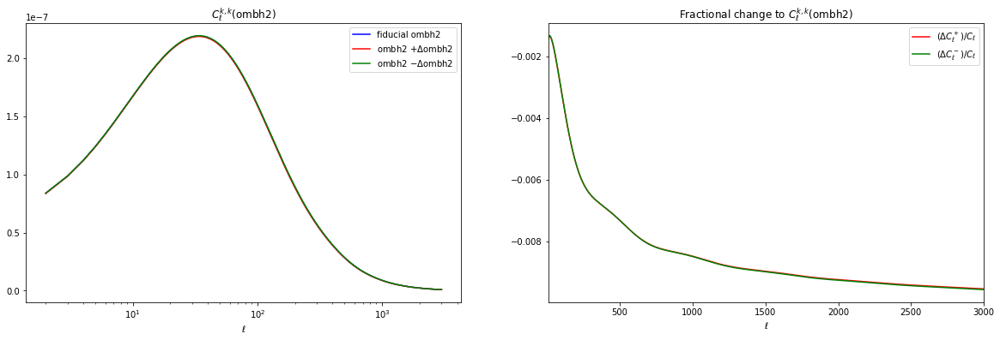

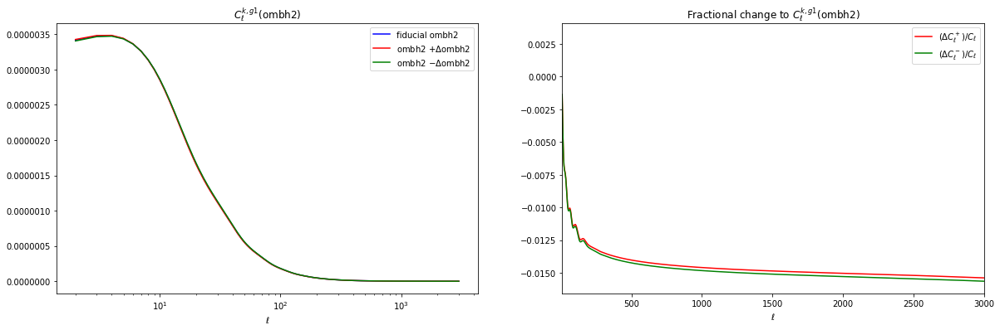

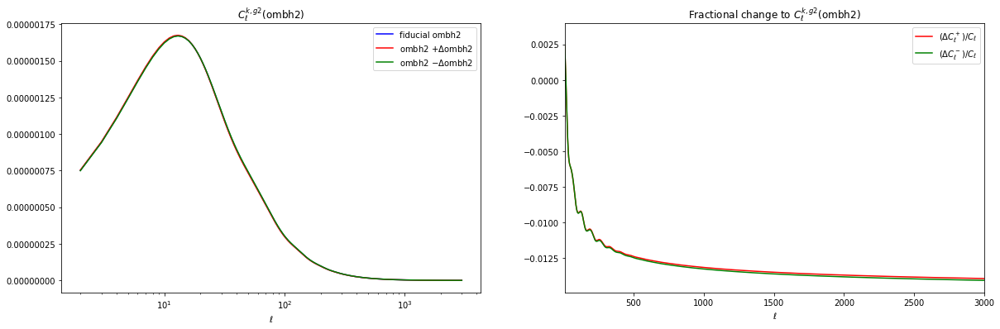

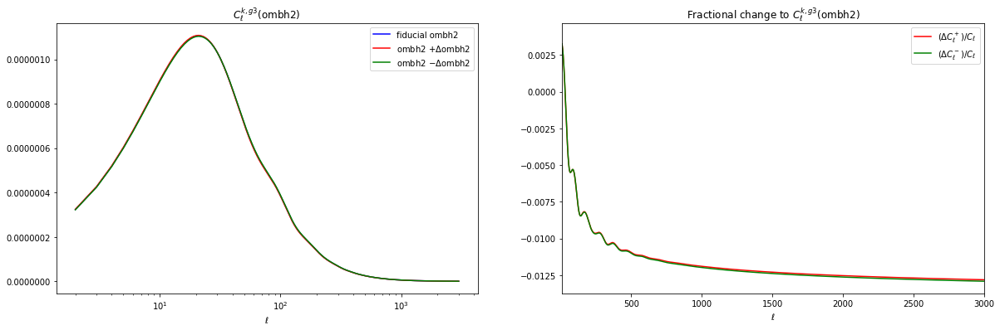

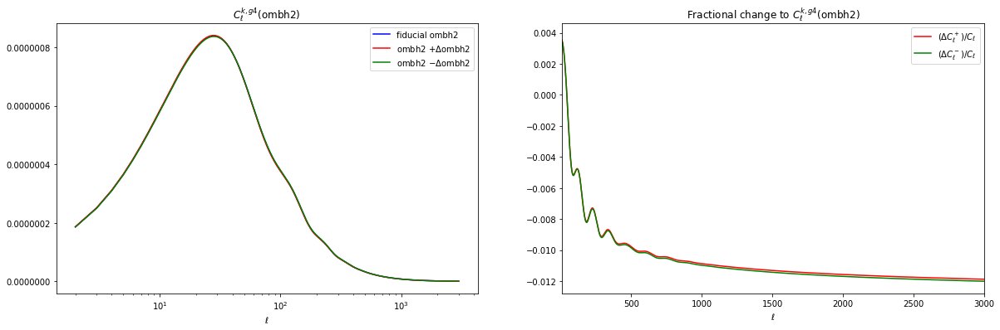

...

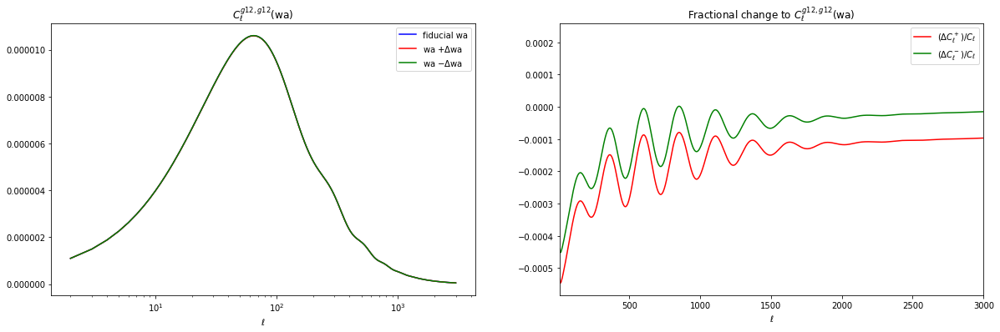

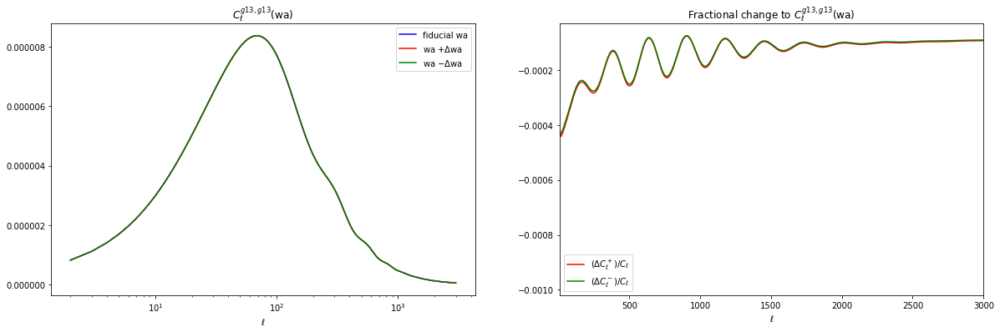

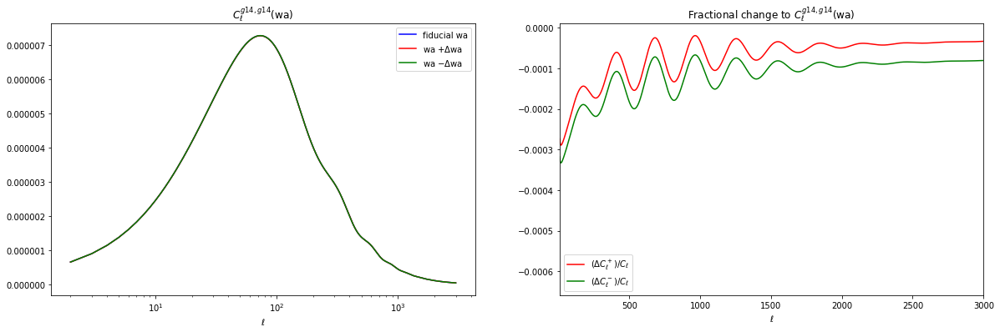

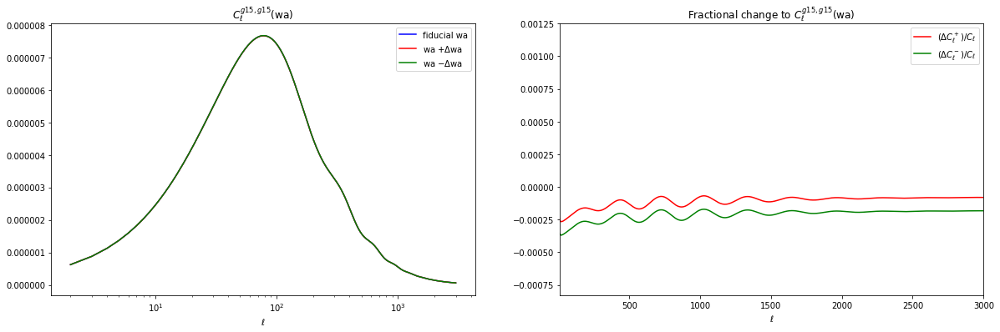

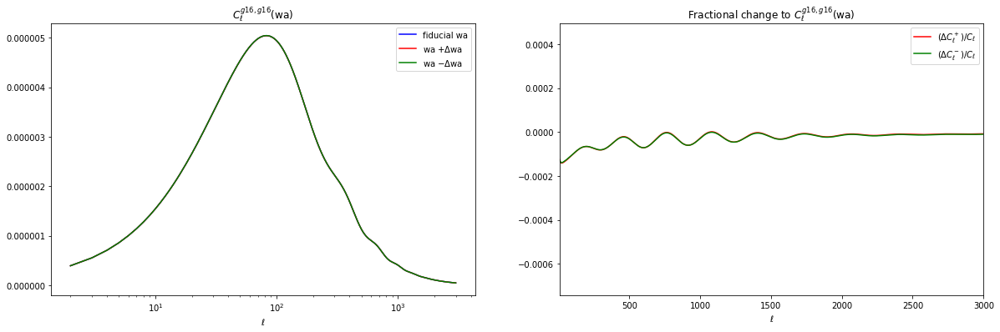

In [14]:
%matplotlib inline
for param in range(nCosParams):        
    for obs1 in range(nMaps):
        for obs2 in range(obs1,nMaps):
            if obs1 == 0 or obs1 == obs2:
                nominal = Fobj.crossCls[obs1,obs2]
                plus = Fobj.crossClsPlus[obs1,obs2,param]
                minus = Fobj.crossClsMinus[obs1,obs2,param]
                obsName = obsNames[obs1*nMaps+obs2 - obs1*(obs1+1)/2]
                f, axarr = plt.subplots(1,2,figsize=(20,6))
                
                plt.sca(axarr[0])
                plt.semilogx(ells,nominal,label='fiducial '+paramList[param],color='b')
                plt.semilogx(ells,plus,label=paramList[param]+r' $+ \Delta$'+paramList[param],color='r')
                plt.semilogx(ells,minus,label=paramList[param]+r' $- \Delta$'+paramList[param],color='g')
                plt.title(r'$C_\ell^{{{0}}}$({1})'.format(obsName,paramList[param]))
                plt.xlabel(r'$\ell$')
                plt.legend()
                
                plt.sca(axarr[1])
                plt.plot(ells,(plus-nominal)/nominal,label=r'$(\Delta C_\ell^+) / C_\ell$',color='r')
                plt.plot(ells,(nominal-minus)/nominal,label=r'$(\Delta C_\ell^-) / C_\ell$',color='g')
                plt.title(r'Fractional change to $C_\ell^{{{0}}}$({1})'.format(obsName,paramList[param]))
                plt.xlabel(r'$\ell$')
                plt.xlim([10,ells[-1]])
                plt.legend()
                
                plt.show()


In [15]:
# apparently the "Rebuild" notebook that added w, wa did not augment crossClsPlus, Minus like crossCls, etc.

# Plot the discrete derivatives

In [16]:
dClVecs = Fobj.dClVecs
print lmax
print lmin
print dClVecs.shape
print '(nCls,nParams,lmax-1) (or lmax-lmin+1 with lmin=2)'
nCls = nMaps*(nMaps+1)/2
print 'nCls:',nCls
nParams = nCosParams+Fobj.nBins
print 'nParams:',nParams

3000
30
(153, 25, 2999)
(nCls,nParams,lmax-1) (or lmax-lmin+1 with lmin=2)
nCls: 153
nParams: 25


In [17]:
# this turned out not to be as nice as the next attempt, below
"""
%matplotlib inline
for ClNum in range(nCls):
    #print ClNum
    plt.figure()
    for paramNum in range(nParams):        
        plt.semilogx(ells,dClVecs[ClNum,paramNum],label=r'$dC_\ell/d${{{0}}}'.format(paramList[paramNum]))
    plt.title(r'$dC_\ell^{{{0}}}/d\theta$'.format(obsNames[ClNum]))
    plt.xlabel(r'$\ell$')
    plt.legend()
    plt.show()
"""

"\n%matplotlib inline\nfor ClNum in range(nCls):\n    #print ClNum\n    plt.figure()\n    for paramNum in range(nParams):        \n        plt.semilogx(ells,dClVecs[ClNum,paramNum],label=r'$dC_\\ell/d${{{0}}}'.format(paramList[paramNum]))\n    plt.title(r'$dC_\\ell^{{{0}}}/d\theta$'.format(obsNames[ClNum]))\n    plt.xlabel(r'$\\ell$')\n    plt.legend()\n    plt.show()\n"

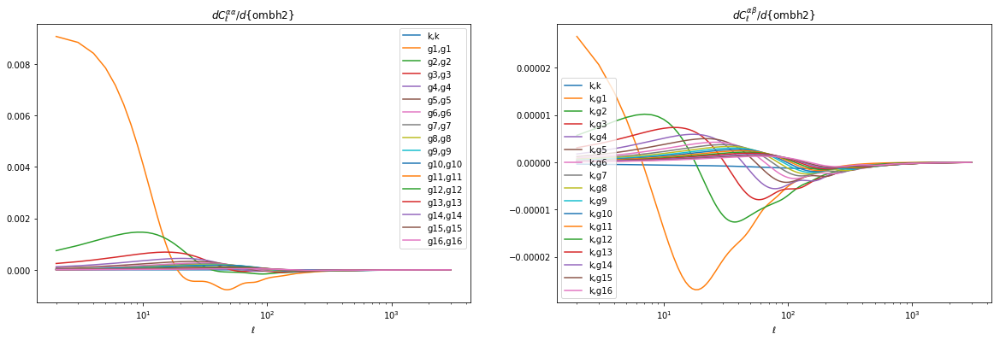

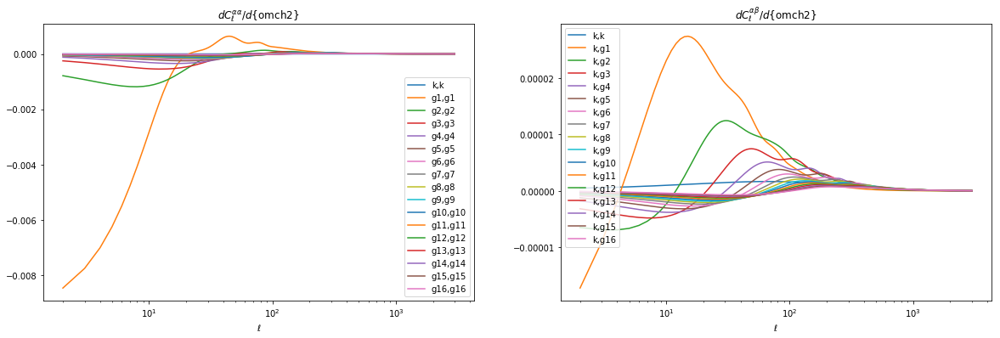

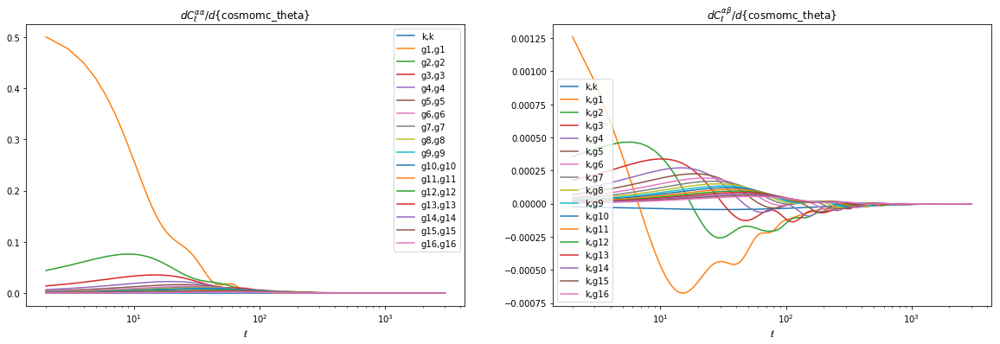

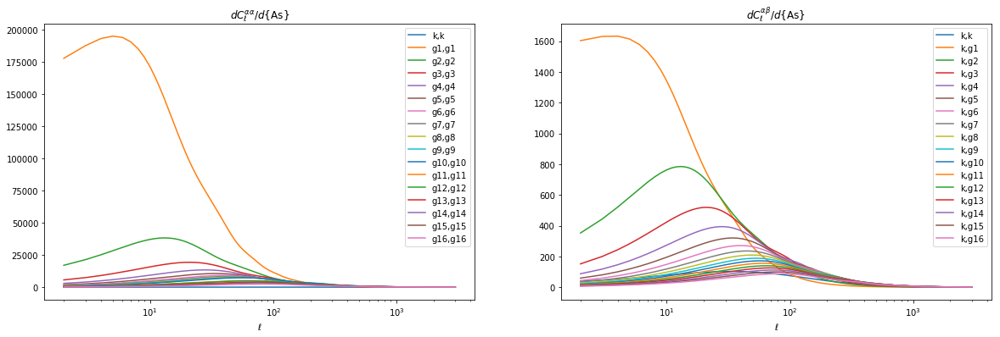

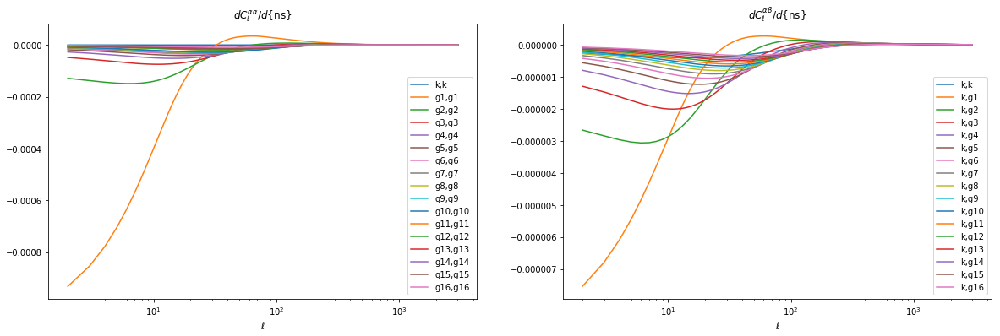

...

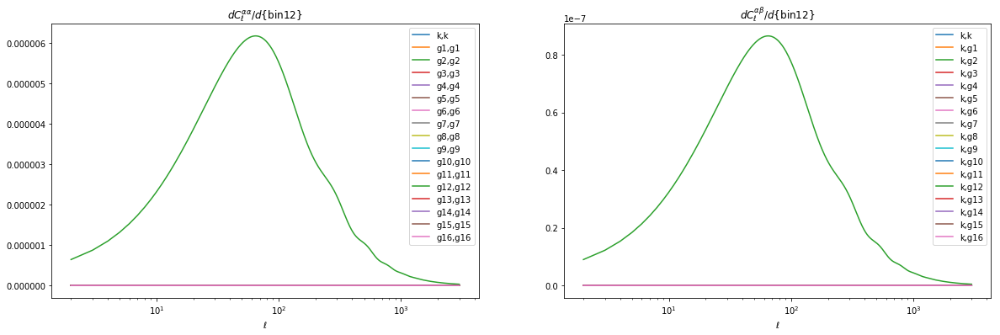

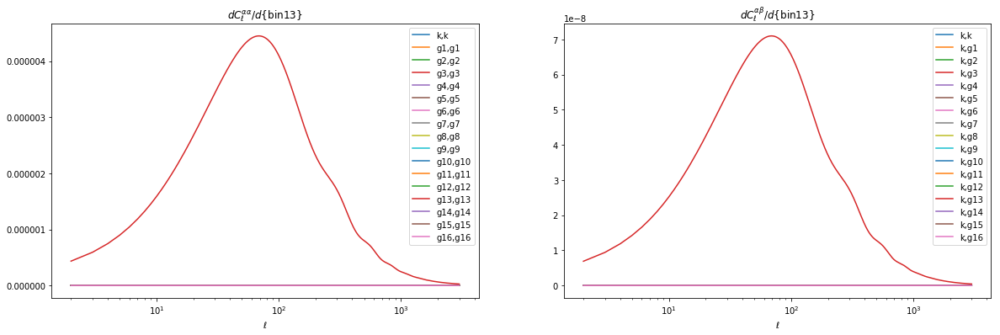

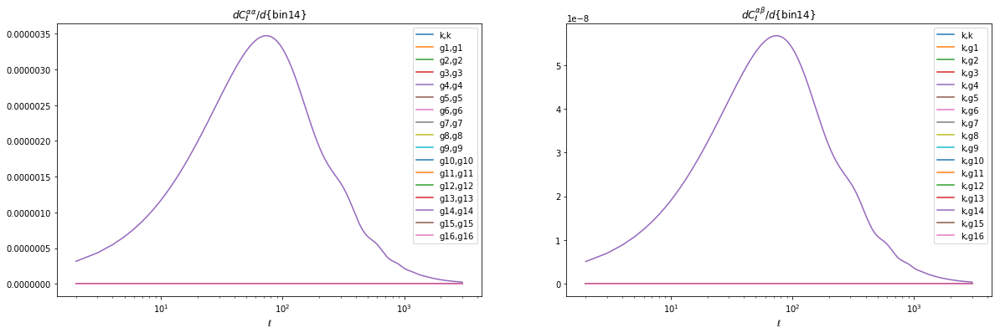

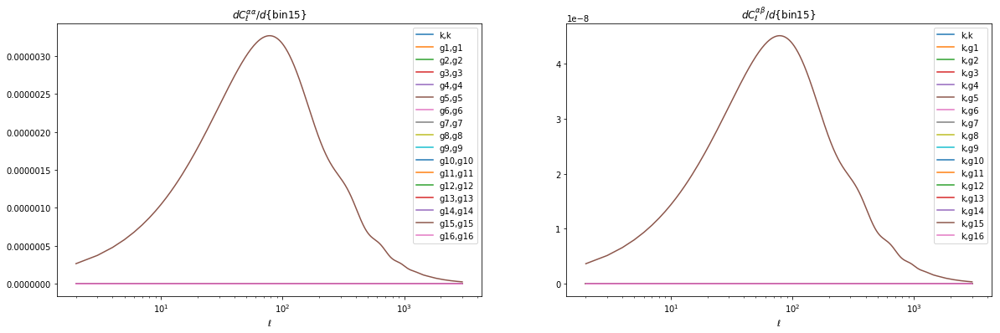

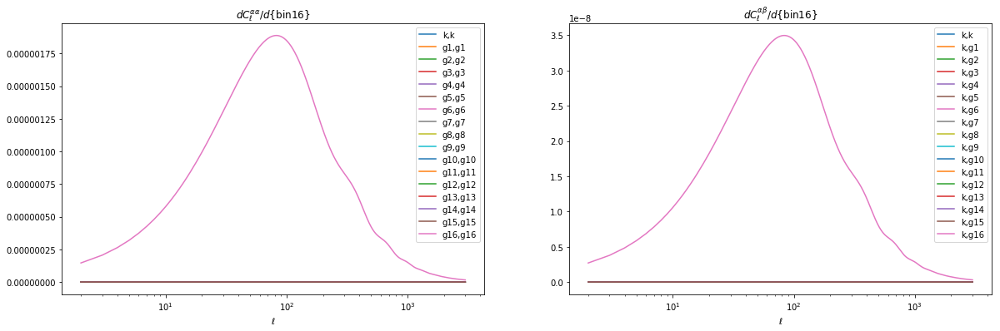

done


In [18]:
%matplotlib inline
for paramNum in range(nParams):    
    #print paramNum
    #plt.figure()
    
    f, axarr = plt.subplots(1,2,figsize=(20,6))            
    for obs1 in range(nMaps):
        for obs2 in range(obs1,nMaps):
            if obs1 == 0 or obs1 == obs2:
                ClNum = obs1*nMaps+obs2 - obs1*(obs1+1)/2
                #obsName = obsNames[ClNum]
                
                if obs1 == 0: # cross with kappa
                    plt.sca(axarr[1])
                    plt.semilogx(ells,dClVecs[ClNum,paramNum],label=obsNames[ClNum]) #r'$dC_\ell^{{{0}}}/d\theta$'.format(obsNames[ClNum]))

                if obs1 == obs2: # auto power
                    plt.sca(axarr[0])
                    plt.semilogx(ells,dClVecs[ClNum,paramNum],label=obsNames[ClNum]) #r'$dC_\ell^{{{0}}}/d\theta$'.format(obsNames[ClNum]))

    plt.sca(axarr[1])            
    plt.title(r'$dC_\ell^{{\alpha\beta}}/d${{{0}}}'.format(paramList[paramNum]))
    plt.xlabel(r'$\ell$')
    plt.legend()
    
    plt.sca(axarr[0])            
    plt.title(r'$dC_\ell^{{\alpha\alpha}}/d${{{0}}}'.format(paramList[paramNum]))
    plt.xlabel(r'$\ell$')
    plt.legend()
    
    plt.show()
    
print 'done'

# play with tau

In [19]:
# play with tau
tauNom = 0.063
tauPlus = 0.076
tauMinus = 0.050

import crosspower as cp
myPkTauNom = cp.MatterPower(tau=tauNom)
myPkTauPlus = cp.MatterPower(tau=tauPlus)
myPkTauMinus = cp.MatterPower(tau=tauMinus)

print 'done'


neutrino_hierarchy =  normal
starting makePkInterp.


finishing makePkInterp.
neutrino_hierarchy =  normal
starting makePkInterp.


finishing makePkInterp.
neutrino_hierarchy =  normal
starting makePkInterp.
finishing makePkInterp.
done


In [20]:
kValues = np.array([0.010776, 0.02, 0.05, 0.1, 0.2, 0.3]) # Mpc^-1
cSpeed = 2.99792458e5 # km/h
H0Nom = myPkTauNom.H0*cSpeed
H0Plus = myPkTauPlus.H0*cSpeed
H0Minus = myPkTauMinus.H0*cSpeed
print H0Nom,H0Plus,H0Minus
kValsNom = kValues/(H0Nom/100)
kValsPlus = kValues/(H0Plus/100)
kValsMinus = kValues/(H0Minus/100)
print kValsNom
print kValsPlus
print kValsMinus

67.4951524022 67.4951524022 67.4951524022
[0.01596559 0.02963176 0.07407939 0.14815879 0.29631758 0.44447637]
[0.01596559 0.02963176 0.07407939 0.14815879 0.29631758 0.44447637]
[0.01596559 0.02963176 0.07407939 0.14815879 0.29631758 0.44447637]


In [21]:
myZ = 0
print 'tau = ',tauPlus,': ',myPkTauPlus.PK.P(myZ,kValsPlus)
print 'tau = ',tauNom,': ',myPkTauNom.PK.P(myZ,kValsNom)
print 'tau = ',tauMinus,': ',myPkTauMinus.PK.P(myZ,kValsMinus)

tau =  0.076 :  [73778.77955835 44371.15221583 16075.63458168  6599.22676865
  2922.61719529  1965.32582327]
tau =  0.063 :  [73780.5817825  44372.22294055 16075.99757825  6599.34457507
  2922.64343118  1965.33406802]
tau =  0.05 :  [73782.14445754 44373.15671514 16076.31445564  6599.44498813
  2922.66642603  1965.34128389]


# Troubleshoot F_ij next

In [22]:
# definition of makeFisher function taken from FisherCl
# modified to remove self references and for troubleshooting

def makeFisher(lmin,lmax,nParams,invCov,dClVecs,TE=False,verbose=False,selfLmin=2,selfLmax=1000):
    """
      Purpose:
        multply vectorT,invcov,vector and add up
      Inputs:
        self: a FisherMatrix object
        lmin: the lowest ell to include in the sum
          must be GE self.lmin
        lmax: the highest ell to inlude in the sum
          must be LE self.lmax
          
        nParams,invCov,dClVecs,self.lmin,self.lmax: these are object fields in the FisherCl version
        
        TE: set to True to compute Fij for T,E instead of k,g; 
            not used in this version
          Default: False
        verbose: set to True to have extra output
          Default: False
          
      Returns:
        a Fisher Matrix, dimensions self.nParams x self.nParams
    """
    
    
    
    if verbose:
      print 'building Fisher matrix from components...'
      print 'invCov.shape: ',invCov.shape,', dClVecs.shape: ',dClVecs.shape

    print 'using local makeFisher version... '
    Fij = np.zeros((nParams,nParams)) # indices match those in paramList
    for i in range(nParams):
      if verbose:
        print 'starting bin set ',i+1,' of ',nParams
      dClVec_i = dClVecs[:,i,:] # shape (nCls,nElls); selected parameter i
      for j in range(nParams):
        dClVec_j = dClVecs[:,j,:] # shape (nCls,nElls); selected parameter j
        # ugh.  don't like nested loops in Python... but easier to program...
        for ell in range(lmax-lmin+1):
            
          # this number indexes invCov and dClVec for the ell value
          # it needs to have ellInd = 0 at ell = 0, selfLmin = 2 (depending on lmin value used to make Fobj)
          # with ell=0, add (lmin-selfLmin), the difference between lmin values
          ellInd = ell+lmin-selfLmin # adjust ell to match indices in arrays
          #ellInd = ell+selfLmin-lmin # adjust ell to match indices in arrays
          #print 'ells: ',ell,selfLmin,lmin,ellInd  #0,2,423,-421
          print 'paramNums = ',i+1,', ',j+1,', ellInd = ',ellInd
            
          myCov = invCov[:,:,ellInd] # shape (nCls,nCls,1)
          myDClVecj = dClVec_j[:,ellInd]
          myDClVeci = dClVec_i[:,ellInd]
            
          print 'myInvCov.shape: ',myCov.shape,', myDClVecj.shape: ',myDClVecj.shape
          #print 'myInvCov: '
          #print myCov
            
          tempMat = np.dot(myCov,myDClVecj)
          print 'myDClVeci.shape: ',myDClVeci.shape,', tempMat.shape: ',tempMat.shape
            
          fij = np.dot(myDClVeci,tempMat)
          print 'fij = ',fij,'\n'
        
          #fij = np.dot(dClVec_i[:,ellInd],np.dot(myCov,dClVec_j[:,ellInd]))
        
        
          Fij[i,j] += fij
    return Fij
    


In [23]:
# load a linear and a nonlinear Fobj for comparison
import FisherCl as fcl
import crosspower as cp
import pickle
filehandlerLin = open('Fisher_4_4Q.obj','r') # accuracyBoost=3,doNorm=True,lmax=1000, epsrel = 1.49e-6; nonlinear=False,
#dw=0.05, from FisherCl branch master
filehandlerNLn = open('Fisher_4_4P.obj','r') # accuracyBoost=3,doNorm=True,lmax=1000, epsrel = 1.49e-6; nonlinear=True,
#dw=0.05, from FisherCl branch master

FobjLin = pickle.load(filehandlerLin) 
FobjNLn = pickle.load(filehandlerNLn) 

"""
lmin = Fobj.lmin
lmax = Fobj.lmax
nMaps = Fobj.nBins + 1
nCosParams = Fobj.nParams - Fobj.nBins
ells = Fobj.ells
obsNames = Fobj.obsNames
paramList = Fobj.paramList
"""

print FobjLin.obsList
print FobjLin.obsNames
print FobjLin.paramList
print FobjNLn.obsList
print FobjNLn.obsNames
print FobjNLn.paramList

[ 0.  1.  2.  3.  4.  6.  7.  8.  9. 12. 13. 14. 18. 19. 24.]
['k,k', 'k,g1', 'k,g2', 'k,g3', 'k,g4', 'g1,g1', 'g1,g2', 'g1,g3', 'g1,g4', 'g2,g2', 'g2,g3', 'g2,g4', 'g3,g3', 'g3,g4', 'g4,g4']
['ombh2', 'omch2', 'cosmomc_theta', 'As', 'ns', 'tau', 'mnu', 'w', 'bin1', 'bin2', 'bin3', 'bin4']
[ 0.  1.  2.  3.  4.  6.  7.  8.  9. 12. 13. 14. 18. 19. 24.]
['k,k', 'k,g1', 'k,g2', 'k,g3', 'k,g4', 'g1,g1', 'g1,g2', 'g1,g3', 'g1,g4', 'g2,g2', 'g2,g3', 'g2,g4', 'g3,g3', 'g3,g4', 'g4,g4']
['ombh2', 'omch2', 'cosmomc_theta', 'As', 'ns', 'tau', 'mnu', 'w', 'bin1', 'bin2', 'bin3', 'bin4']


In [24]:
# get some variables to work with
nParams = FobjLin.nParams
invCov = FobjLin.invCov
dClVecs = FobjLin.dClVecs

print nParams
print invCov.shape
print dClVecs.shape

12
(15, 15, 999)
(15, 12, 999)


In [25]:
# makeFisher needs to have way less output if I'm going to run this
"""
FijLinA = FobjLin.Fij
FijLinB = makeFisher(2,1000,nParams,invCov,dClVecs)
print FijLinA-FijLinB
"""

'\nFijLinA = FobjLin.Fij\nFijLinB = makeFisher(2,1000,nParams,invCov,dClVecs)\nprint FijLinA-FijLinB\n'

In [26]:
# from 15 observable Cls and 999 ells, pick one of each:
ClPick = 4 # starting Cl
nCls = 3
paramPick = 5 # starting param
nParams = 2

myEllmin = 423
myEllmax = 450
ellSize = myEllmax-myEllmin+1
subInvCov = invCov[ClPick:ClPick+nCls,ClPick:ClPick+nCls,myEllmin:myEllmax+1].reshape(nCls,nCls,ellSize)
subDClVecs = dClVecs[ClPick:ClPick+nCls,paramPick:paramPick+nParams,myEllmin:myEllmax+1].reshape(nCls,nParams,ellSize)
print 'subInvCov.shape: ', subInvCov.shape
print 'subDClVecs.shape: ', subDClVecs.shape, '\n'
#print makeFisher(myEllmin+17,myEllmax-5,nParams,subInvCov,subDClVecs,selfLmin=myEllmin,selfLmax=myEllmax)
print makeFisher(444,445,nParams,subInvCov,subDClVecs,selfLmin=myEllmin,selfLmax=myEllmax)

subInvCov.shape:  (3, 3, 28)
subDClVecs.shape:  (3, 2, 28) 

using local makeFisher version... 
paramNums =  1 ,  1 , ellInd =  21
myInvCov.shape:  (3, 3) , myDClVecj.shape:  (3,)
myDClVeci.shape:  (3,) , tempMat.shape:  (3,)
fij =  0.0022331518422206774 

paramNums =  1 ,  1 , ellInd =  22
myInvCov.shape:  (3, 3) , myDClVecj.shape:  (3,)
myDClVeci.shape:  (3,) , tempMat.shape:  (3,)
fij =  0.002246915664295517 

paramNums =  1 ,  2 , ellInd =  21
myInvCov.shape:  (3, 3) , myDClVecj.shape:  (3,)
myDClVeci.shape:  (3,) , tempMat.shape:  (3,)
fij =  0.519484980747192 

paramNums =  1 ,  2 , ellInd =  22
myInvCov.shape:  (3, 3) , myDClVecj.shape:  (3,)
myDClVeci.shape:  (3,) , tempMat.shape:  (3,)
fij =  0.5286998489373294 

paramNums =  2 ,  1 , ellInd =  21
myInvCov.shape:  (3, 3) , myDClVecj.shape:  (3,)
myDClVeci.shape:  (3,) , tempMat.shape:  (3,)
fij =  0.519484980747192 

paramNums =  2 ,  1 , ellInd =  22
myInvCov.shape:  (3, 3) , myDClVecj.shape:  (3,)
myDClVeci.shape:  (3,) , te

In [27]:
# re-do fisher calc with revised make_fisher routine
# get some variables to work with
nParamsLin = FobjLin.nParams
invCovLin = FobjLin.invCov
dClVecsLin = FobjLin.dClVecs
nParamsNLn = FobjNLn.nParams
invCovNLn = FobjNLn.invCov
dClVecsNLn = FobjNLn.dClVecs

print nParamsLin
print invCovLin.shape
print dClVecsLin.shape
print nParamsNLn
print invCovNLn.shape
print dClVecsNLn.shape

12
(15, 15, 999)
(15, 12, 999)
12
(15, 15, 999)
(15, 12, 999)


In [28]:
# get Fisher matrices with lmin = 50
# makeFisher needs to have way less output if I'm going to run this
"""
lmin=50
lmax=1000
FijLin = makeFisher(lmin,lmax,nParamsLin,invCovLin,dClVecsLin)
FijNLn = makeFisher(lmin,lmax,nParamsNLn,invCovNLn,dClVecsNLn)
"""

'\nlmin=50\nlmax=1000\nFijLin = makeFisher(lmin,lmax,nParamsLin,invCovLin,dClVecsLin)\nFijNLn = makeFisher(lmin,lmax,nParamsNLn,invCovNLn,dClVecsNLn)\n'